### Imports

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
# Computational packages
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import tqdm
#import cv2 as cv

# General packages
import datetime
import sys
import os

# custom packages
import ratsimulator
from ratsimulator.Environment import Rectangle
import spatial_maps as sm # CINPLA spatial maps

# avoid adding multiple relave paths to sys.path
sys.path.append("../../src") if "../../src" not in sys.path else None 
from PlaceCells import PlaceCells
from Models import SorscherRNN
from Experiment import Experiment
from methods import *
from datahandling import *
from stats import *
from astropy.convolution import Gaussian2DKernel, convolve

import umap
from sklearn.cluster import DBSCAN 
import plotly.graph_objects as go
import plotly.offline as pyo
# Set notebook mode to work in offline
pyo.init_notebook_mode()

In [3]:
plt.rcParams.update({'figure.figsize': (3,2), 'figure.dpi': 150, 'legend.frameon': False})
# sns.set_style('white', {'legend.frameon': False})
palette = {'setosa': '#7fc97f', 'versicolor': '#beaed4', 'virginica': '#fdc086'}

def savefig(fname):
    plt.savefig(f'{fname}.svg', bbox_inches='tight', transparent=True)
    
"""
sns.countplot(data=df, x=df.variety, palette=palette)
plt.xticks(rotation=45)
sns.despine()
plt.xlabel('')
savefig('count')
"""

"\nsns.countplot(data=df, x=df.variety, palette=palette)\nplt.xticks(rotation=45)\nsns.despine()\nplt.xlabel('')\nsavefig('count')\n"

In [4]:
# aggregate methods for finding different statistics given a stack of ratemaps

def find_spacings(maps):
     return np.array([list(map(lambda x: grid_spacing(x)[0], maps[i])) for i in range(len(maps))])

def find_orientations(maps):
    return np.array([list(map(lambda x: grid_orientation(x)[0], maps[i])) for i in range(len(maps))])

def find_shifts(maps):
    """Find (upper triangular) array of relative shifts
    
    params:
    maps (np.ndarray): ratemaps in each environment, shape (n_envs, n_maps, nx, ny)
    where n_envs is number of environments, n_cells the number of ratemaps,
    nx, ny the pixel dimension of each map.
    
    returns:
    relative_shifts (np.array): upper triangular array of shifts 
        between envs, shape (n_envs, n_envs, n_cells , n_cells, 2)
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    mb_size = 50
    N = maps.shape[1]
    n_envs = len(maps)
    relative_shifts = np.zeros((n_envs, n_envs, N, N, 2))
    pbar = tqdm.tqdm(total = int(n_envs*(n_envs+1)/2), position = 0, ncols = 100)
    for env_i in range(n_envs):
        for env_j in range(env_i, n_envs):
            pbar.update()
            for mb in range(0,N,mb_size):
                # 
                ratemaps_i = torch.tensor(maps[env_i,mb:mb+mb_size], device=device)
                ratemaps_j = torch.tensor(maps[env_j], device=device)
                corrs = torch.nn.functional.conv2d(ratemaps_i[:,None], ratemaps_j[:,None], padding='same').detach().cpu().numpy()
                for ki in range(mb_size):
                    for kj in range(N):
                        #print(mb+ki) # slicing error?
                        relative_shifts[env_i, env_j,mb+ki,kj] = phase_shift2(corrs[ki,kj])
    pbar.close()
    return relative_shifts

In [5]:
# and some handy plotting methods

def plot_orientations(thetas, kappa = 50, **kwargs):
    #fig,ax = plt.subplots(figsize=(14,6),subplot_kw={'projection': 'polar'})
    fig,ax = plt.subplots(figsize=(14,6))
    plt.hist(thetas.flatten(), density=True, **kwargs)
    phi = np.linspace(0, 2*np.pi, 1001)
    for i, theta in enumerate(thetas):
        von_mises_pdf = circular_kernel(theta, kappa=kappa)
        ax.plot(phi, von_mises_pdf(phi))
    plt.xlabel('Radians')
    plt.ylabel('Density')
    plt.title('Grid orientation (circular plot)')

def plot_spacings(spacings, bw_adjust = 0.5, **kwargs):
    plt.figure(figsize=(14,6))
    plt.hist(spacings.flatten(), density=True, **kwargs)
    sns.kdeplot(data=spacings.T, bw_adjust=bw_adjust, fill=True, alpha=0.35, 
                legend = False, palette='inferno', common_norm=False, linewidth=1)
    plt.xlabel('Meters [m]')
    plt.title('Peak Spacing')


## First, we create synthetic data to provide a baseline and verify our methods

In [6]:
def synth_grid(xx, yy, phase = 0, orientation = 0, f = 3):
    """ Create ratemaps for n synthetic grid cells
    params:
    xx, yy (np.ndarray): coordinate grids of shape (nx, ny)
    phase (np.array): phase shifts of shape (n,)
    orientation (float): orientation of grid cells. Shared by all n cells
    f (float): grid frequency
    """
    
    theta = np.array([i*np.pi/3 for i in range(3)]) + orientation
    kx = np.cos(theta)
    ky = np.sin(theta)
    
    x_phase = xx[None] + phase[:,0,None,None]
    y_phase = yy[None] + phase[:,1,None,None]
    inner_prod = kx[None,:,None,None]*x_phase[:,None] + ky[None,:,None,None]*y_phase[:,None]
    gc = np.clip(1/3*np.sum(np.cos(2*np.pi*f*inner_prod), axis = 1), 0, 1)
    return gc


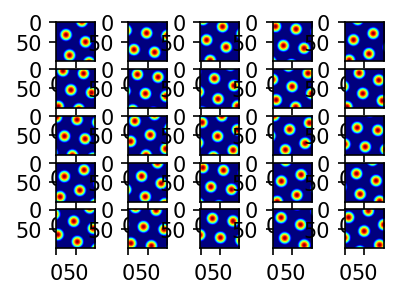

In [7]:
#n = 32
n = 100
x = np.linspace(0, 2.2, n) # Boxsize same as default
y = np.linspace(0, 2.2, n)
xx, yy = np.meshgrid(x,y)

# create modules
# each with unique random phases and orientations
n_envs = 1
n_mods = 3 # one for umap
cells_per_mod = 500
# every cell has a random phase
phases = np.random.uniform(-2, 2, (n_mods, cells_per_mod, 2))
# every module has a shared orientation
orientations = np.random.uniform(0, 2*np.pi, n_mods) # random orientation
# save resulting orientation
actual_orientations = np.zeros((n_envs, n_mods)) # save shifted orientations

# each module has a unique phase and orientation shift in each env.
phase_shifts = np.random.uniform(-4, 4, (n_envs, n_mods, 2))
orientation_shifts = np.random.uniform(0, np.pi/3, (n_envs, n_mods))

synth_maps = np.zeros((n_envs, n_mods*cells_per_mod, n, n))
fs = [1 for i in range(n_mods)] # grid frequency the same for all (for now)
#fs[1] = 0.75

for i in range(n_envs):
    for j in range(n_mods):
        # cells per mod, 2 + None
        phase = phases[j] + phase_shifts[i,j][None] # modules phase shift coherently
        actual_orientations[i,j] =  orientations[j] + orientation_shifts[i,j] # and rotate coherently
        gc = synth_grid(xx, yy, phase, actual_orientations[i,j], f = fs[j]) # create ratemaps
        synth_maps[i,j*cells_per_mod: (j+1)*cells_per_mod] = gc # save module ratemap activity

# plot a random selection of cells         
env = 0
m = 5
fig, ax = plt.subplots(m, m)
for i in range(m**2):
    row = i // m
    col = i % m
    show = np.random.randint(synth_maps.shape[1])
    ax[row, col].imshow(synth_maps[env,show], cmap = "jet")
plt.show()

### Then compute & plot grid spacing and orientation

In [8]:
synth_spacings = find_spacings(synth_maps)
synth_orientations = find_orientations(synth_maps)

(0.0, 6.283185307179586)

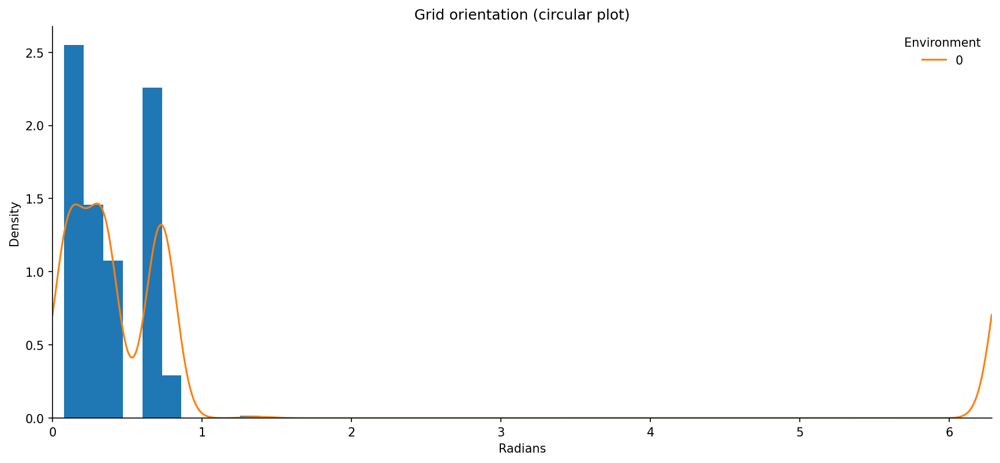

In [9]:
plot_orientations(synth_orientations, kappa = 100) # adjust kappa as needed for sharpness

# set additional plot params
sns.despine() # maybe set these in style sheet instead?
plt.legend(title = "Environment", labels = [i for i in range(len(synth_orientations))], frameon = False)
plt.xlim([0, 2*np.pi])
#plt.locator_params(nbins=4)

#loc = "./"
#plt.savefig(f"{loc}synth_orientations.svg")
#plt.savefig("./grid-orientations.pdf")

(0.0, 3.111269837220809)

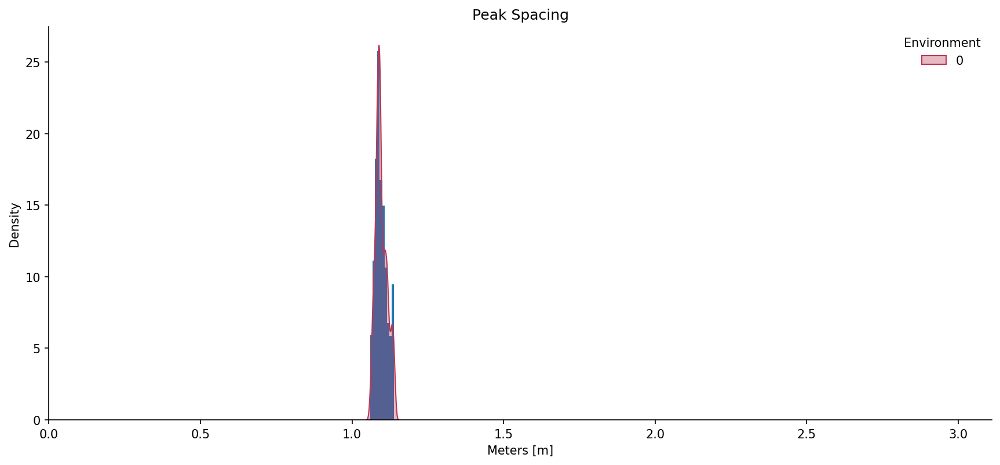

In [10]:
plot_spacings(synth_spacings, bw_adjust = 1.0) 

sns.despine() # maybe set these in style sheet instead?
plt.legend(title = "Environment", labels = [i for i in range(len(synth_spacings))], frameon = False)

# hardcoded boxsize
max_spacing = np.sqrt(2*2.2**2)  # synth box diagonal
plt.xlim([0, max_spacing])

#loc = "./"
#plt.savefig(f"{loc}synth_orientations.svg")

In [11]:
synth_maps.shape

(1, 1500, 100, 100)

In [12]:

n_envs = len(synth_maps)
if n_envs > 2:
    # do violin plot for synthetic data
    N = synth_maps.shape[1]
    shifts = np.zeros((n_envs,n_envs, N))
    for i in range(n_envs):
        for j in range(i, n_envs):
            shifts[i,j] = np.array(list(map(lambda x: phase_shift(*x), zip(synth_maps[i],synth_maps[j]))))
    upper_flat_triangle = shifts[np.triu_indices(shifts.shape[0],k=1)] 

    data = []
    for env_phase in upper_flat_triangle:
        data.append(env_phase[~np.isnan(env_phase)])
    fig,ax = plt.subplots()
    ax.violinplot(data)


## Load Experiment

In [13]:
base_path = "/home/users/vemundss/"
experiment = Experiment(name = '3ME', base_path=base_path)

#base_path = "/mnt/WD12TB-HDD"
#experiment = Experiment(name = '3ME_large_batch', base_path=base_path)
experiment.setup()

# detach experiment specifics
params = experiment.params
environments = experiment.environments
agents = experiment.agents
pc_ensembles = experiment.pc_ensembles
paths = experiment.paths

Experiment <3ME> already EXISTS. Loading experiment settings!
Loading experiment details
This experiment has ALREADY been setup - SKIPPING.


### Load and smooth all ratemaps for all environments

In [14]:
kernel = Gaussian2DKernel(x_stddev=1)
ratemaps = []
for env_i in range(len(environments)):
    with open(experiment.paths['ratemaps'] / f'env_{env_i}' / filenames(experiment.paths['ratemaps'] / f'env_{env_i}')[-1], "rb") as f:
        ratemaps.append(convolve(pickle.load(f), kernel.array[None]))

ratemaps = np.concatenate(ratemaps)

In [15]:
scores = []
score_files = os.listdir(experiment.paths["grid_scores"])
for fname in score_files:
    if not "novel" in fname:
        with open(f"{experiment.paths['grid_scores']}/{fname}", "rb") as f:
            print(f"{experiment.paths['grid_scores']}/{fname}")

            scores.append(pickle.load(f))
scores = np.concatenate(scores)

/home/users/vemundss/data/emergent-grid-cells/3ME/grid_scores/2999_env_2.pkl
/home/users/vemundss/data/emergent-grid-cells/3ME/grid_scores/2999_env_0.pkl
/home/users/vemundss/data/emergent-grid-cells/3ME/grid_scores/2999_env_1.pkl


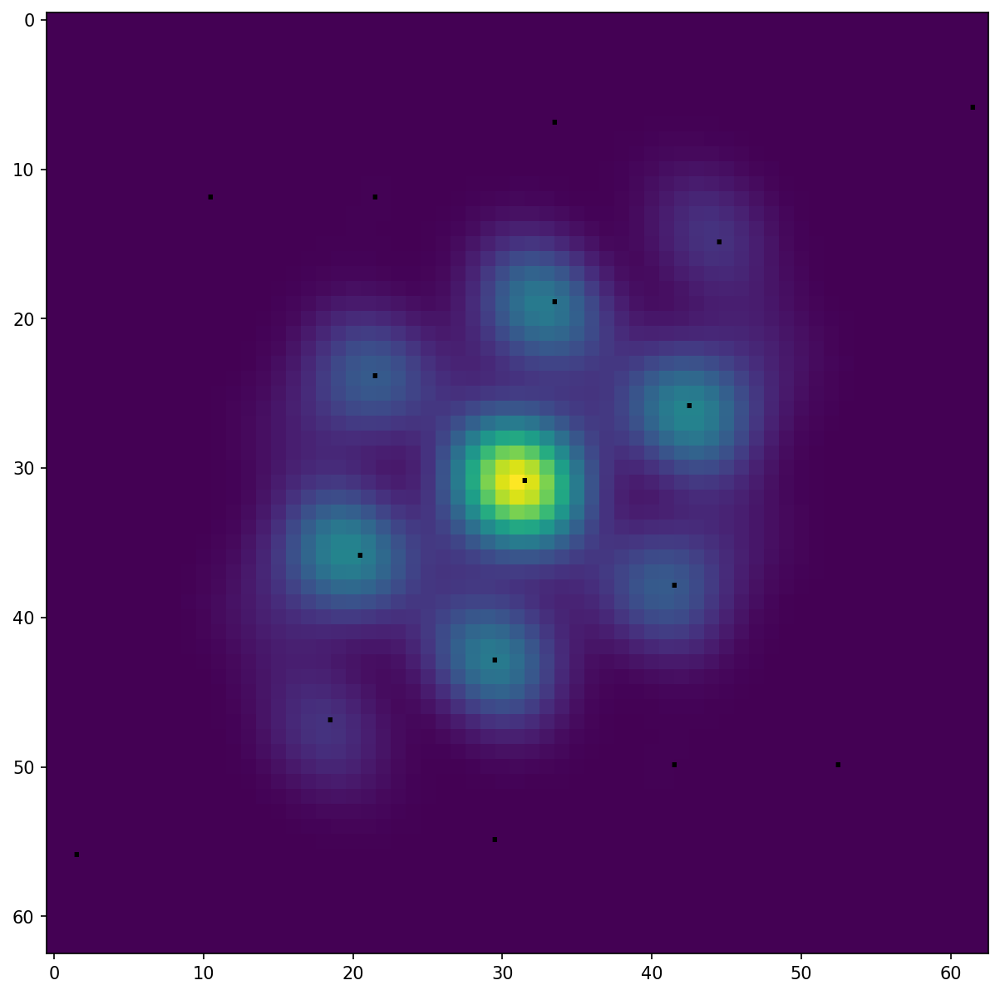

In [16]:
unit=0 # show a particular cell
img = scipy.signal.correlate(ratemaps[unit], ratemaps[unit], mode='full')

peaks = sm.find_peaks(img)
fig,ax = plt.subplots(figsize=(10,10))
ax.imshow(img.T)

for peak in peaks:
    ax.annotate('.', xy=peak, fontsize=25)

In [17]:
def env_split(stats, Ng=4096):
    # stack ratemaps by environment
    env_stat = []
    for env_i in range(len(environments)):
        tmp = stats[Ng*env_i:Ng*(env_i+1)]
        env_stat.append(tmp)
    return np.array(env_stat)

scores = env_split(scores)
ratemaps = env_split(ratemaps)

Now we select cells with high grid scores in *all* environments

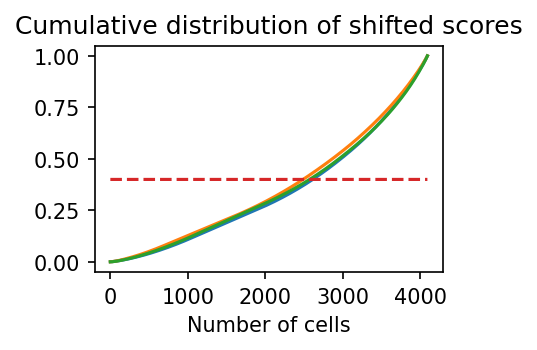

Grid score thresholds for 40.0th percentile: [0.18819445 0.20940694 0.1369923 ]
# Accepted cells: 692


In [18]:
# procedure: 
# - first, grid scores can be negative, so simply shift minimum to zero.
# - sort scores
# - compute cumulative distribution
# - determine threshold score to be in top x percentile based on index from cumulative dist.
# - shift threshold back to actual score
# - mask out cells above threshold

shifted = scores - np.amin(scores, axis = -1)[:,None] # shift to be above zero.
sorted_scores = np.sort(shifted, axis = -1)

cumulative_score = np.cumsum(sorted_scores, axis = -1)/np.sum(shifted, axis = -1, keepdims = True)

percentile_value = 0.4 # top 30 % 
plt.plot(cumulative_score.T)
plt.plot(np.arange(cumulative_score.shape[1]), percentile_value*np.ones(cumulative_score.shape[1]), "--")
plt.xlabel("Number of cells")
plt.title("Cumulative distribution of shifted scores")
plt.show()

cumulative_mask = cumulative_score > percentile_value
# thresh is score required to be in top x percentile in every env.
thresh = [np.amin(sorted_scores[i,cumulative_mask[i]]) for i in range(len(cumulative_mask))]

actual_thresh = thresh + np.amin(scores, axis = -1) # shift back
print(f"Grid score thresholds for {percentile_value*100}th percentile:", actual_thresh)
# mask must be true across environments, hence prod
accept_mask = np.array([scores[i] > actual_thresh[i] for i in range(len(scores))]) ####################### I Used prod again!
#accepted_maps = [ratemaps[:,accept_mask]]

accept_mask = np.prod(accept_mask, axis = 0).astype("bool")
accepted_maps = ratemaps[:,accept_mask]
print("# Accepted cells:", np.sum(accept_mask))

In [19]:
ratemaps.shape, accept_mask.shape

((3, 4096, 32, 32), (4096,))

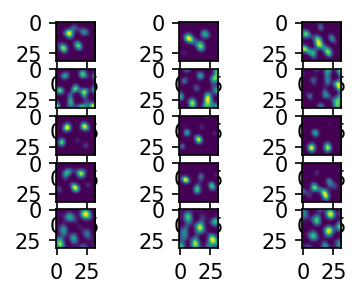

In [20]:
# plot a selection of accepted cells across envs
fig, ax = plt.subplots(5, 3)
for i in range(5):
    for j in range(len(accepted_maps)):
        ax[i,j].imshow(accepted_maps[j,i])
plt.show()

In [21]:
grid_spacings = find_spacings(accepted_maps)
grid_orientations = find_orientations(accepted_maps)

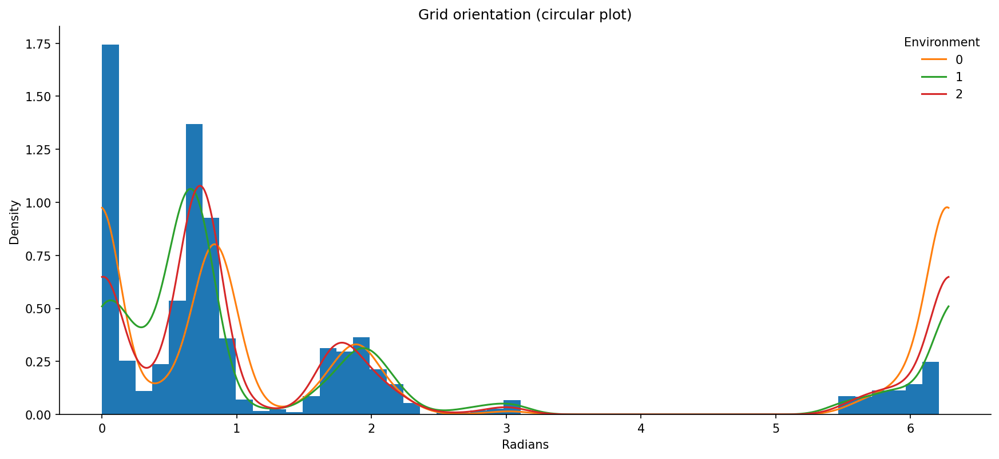

In [22]:
no_orientation = np.any(np.isnan(grid_orientations), axis = 0) # remove NaNs
safe = grid_orientations[:,~no_orientation]  

plot_orientations(safe, kappa = 50, bins=50) # adjust kappa as needed for sharpness

# set additional plot params
sns.despine() # maybe set these in style sheet instead?
plt.legend(title = "Environment", labels = [i for i in range(len(grid_orientations))], frameon = False)
#plt.xlim([0, 2*np.pi])

#loc = "./"
#plt.savefig(f"{loc}synth_orientations.svg")

(0.0, 3.111269837220809)

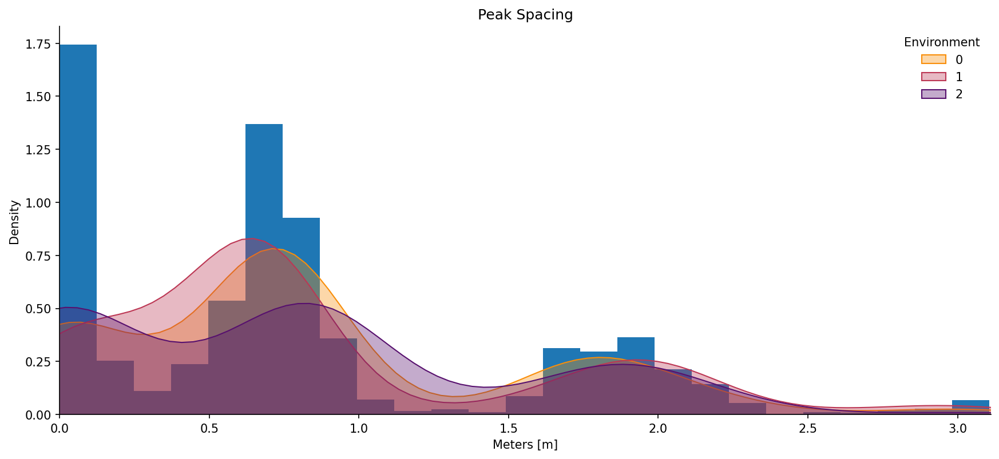

In [23]:
no_spacing = np.any(np.isnan(grid_spacings), axis = 0) # remove NaNs
safe = grid_orientations[:,~no_spacing] 
plot_spacings(safe, bins=50) 

sns.despine() # maybe set these in style sheet instead?
plt.legend(title = "Environment", labels = [i for i in range(len(environments))], frameon = False)

# hardcoded boxsize
max_spacing = np.sqrt(2*2.2**2)  # synth box diagonal
plt.xlim([0, max_spacing])

#loc = "./"
#plt.savefig(f"{loc}synth_orientations.svg")

In [24]:
# only calculate the upper triangular part of the matrix - since the matrix is symmetric,
# the lower triangular part is a copy of the upper triangular
shifts = np.zeros((len(environments),len(environments), accepted_maps.shape[1]))
for i in range(len(environments)):
    for j in range(i, len(environments)):
        shifts[i,j] = np.array(list(map(lambda x: phase_shift(*x), zip(accepted_maps[i],accepted_maps[j]))))
upper_flat_triangle = shifts[np.triu_indices(shifts.shape[0],k=1)]

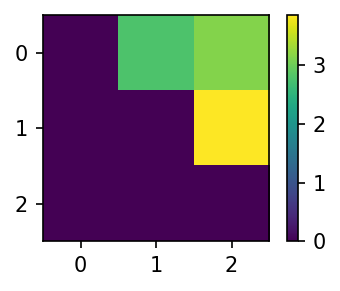

In [25]:
plt.imshow(np.nanmean(shifts,axis=-1))
plt.colorbar()

In [26]:
if n_envs > 2:
    data = []
    for env_phase in upper_flat_triangle:
        data.append(env_phase[~np.isnan(env_phase)])
    fig,ax = plt.subplots()
    ax.violinplot(data)
    labels=['1<->2','1<->3','2<->3']
    ax.set_xticks(np.arange(1, len(labels) + 1), labels=labels)
    plt.xlabel("environment idx")
    plt.ylabel("phase shift")

In [27]:
#import plotly.io as pio
#pio.renderers.default = 'colab' # or 'notebook' or 'iframe' or 'jupyterlab'

In [28]:
def plot_3d_proj(data, tags):
    fig = go.Figure(data=[go.Scatter3d(
        x=data[:,0],
        y=data[:,1],
        z=data[:,2],
        mode='markers',
        marker=dict(
            size=1,
            color=tags,                # set color to an array/list of desired values
            colorscale='Hsv',   # choose a colorscale
            opacity=0.8
        )
    )])
    # tight layout
    fig.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    fig.show()



In [29]:
# transpose and flatten
data = np.reshape(np.transpose(accepted_maps, (0, -2, -1, 1)), (-1, accepted_maps.shape[1]))

fit = umap.UMAP(n_components = 3)
u = fit.fit_transform(data)
plot_3d_proj(u, np.ones(len(data)))
#plt.scatter(u[:,0], u[:,1])

In [30]:
# transpose and flatten
print(synth_maps.shape)
data = np.transpose(synth_maps, (0, 2, 3, 1))
#data = np.reshape(data, (-1, n_mods*cells_per_mod))
data = data[0]
data = data.reshape((-1, n_mods*cells_per_mod))

data = np.array([np.ravel(synth_maps[:,i]) for i in range(synth_maps.shape[1])]).T
print(data.shape)
u = fit.fit_transform(data)
fit = umap.UMAP(n_components = 3)
plot_3d_proj(u, np.ones(len(data))) 
# 3 environments!

(1, 1500, 100, 100)
(10000, 1500)


## Make a test umap plot using synthetic gc data with one module, points sampled at random

In [31]:
n = 50000 # number of samples
ng = 1000 # number of cells
f = 1 # frequency
x = np.random.uniform(0, 2.2, n)
y = np.random.uniform(0, 2.2, n)

p = np.random.uniform(-4, 4, (ng, 2)) # phase shift

theta = np.array([i*np.pi/3 for i in range(3)])
kx = np.cos(theta)
ky = np.sin(theta)
xp = x[:,None] - p[None,:,0]
yp = y[:,None] - p[None,:,1]
print(xp.shape, yp.shape)

inner_prod = kx[None,:,None]*xp[:,None] + ky[None,:,None]*yp[:,None]
gc = np.clip(1/3*np.sum(np.cos(2*np.pi*f*inner_prod), axis = 1), 0, 1)


(50000, 1000) (50000, 1000)


In [32]:
fit = umap.UMAP(n_components = 3)
u = fit.fit_transform(gc)
plot_3d_proj(u, np.ones(len(data)))


In [33]:
# Then we test plotting the ratemaps!
res = scipy.stats.binned_statistic_2d(x,y, gc.T, bins = 70)

In [34]:
fit = umap.UMAP(n_components = 3)
print(res.statistic.shape)
data = np.reshape(res.statistic, (ng, -1)).T
print(data.shape)
u = fit.fit_transform(data)
plot_3d_proj(u, np.ones(len(data)))


(1000, 70, 70)
(4900, 1000)


## Grid Module Identification
- Ala Gardner et al. (2022)

In this approach, we compute the autocorrelation of each cell, remove the central peak, and perform a UMAP dimensionality reduction on the ensemble autocorrelation matrix. This should lead to clustering of cells with similar autocorrelation.

We can then do actual clustering on the reduced data to find grid modules. This is done using DBSCAN.

In [35]:
def autocorr(ratemaps, **kwargs):
    img_size = (ratemaps.shape[-1]*2 - 1)
    corrs = np.zeros((ratemaps.shape[0], ratemaps.shape[1], img_size, img_size))
    
    for i in range(ratemaps.shape[0]):
        for j in range(ratemaps.shape[1]):
            corrs[i,j] = scipy.signal.correlate(ratemaps[i,j], ratemaps[i,j], **kwargs)
    return corrs

def find_dist(sacs):
    from methods import _find_inner_circle_dist
    dists = np.zeros(sacs.shape[:2])

    for i in range(sacs.shape[0]):
        for j in tqdm.tqdm(range(sacs.shape[1])):
            dists[i,j],_ = _find_inner_circle_dist(sacs[i,j])
    return dists

In [36]:
print(ratemaps.shape)
corrs = autocorr(synth_maps)

(3, 4096, 32, 32)


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1500/1500 [00:08<00:00, 171.79it/s]


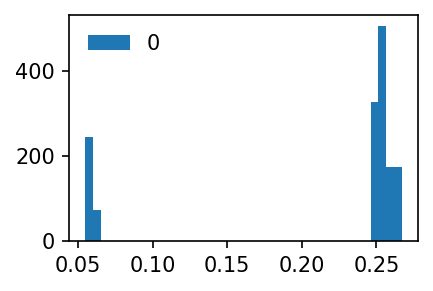

In [37]:
dists = find_dist(corrs)    

for i, distance in enumerate(dists):
    plt.hist(np.sqrt(distance)/corrs.shape[-1]/2, label = i, bins = 40)
plt.legend()

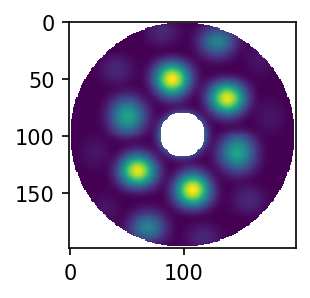

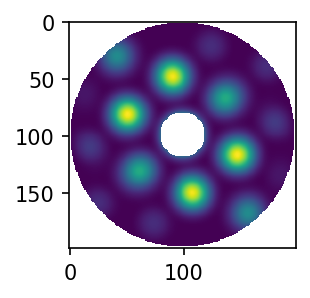

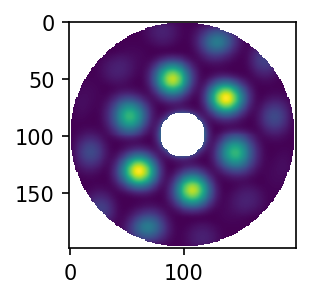

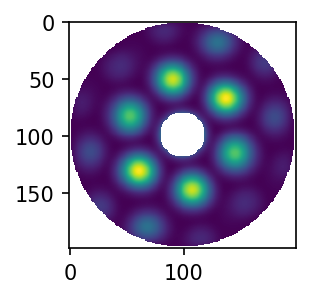

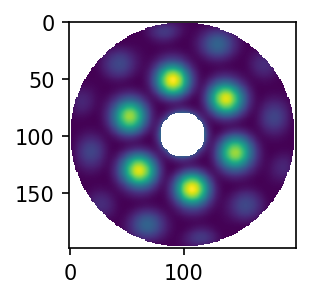

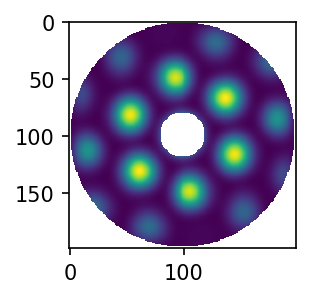

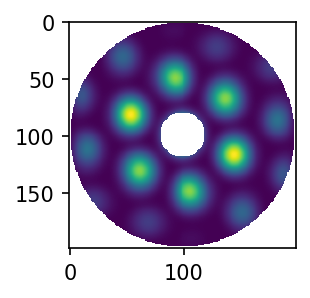

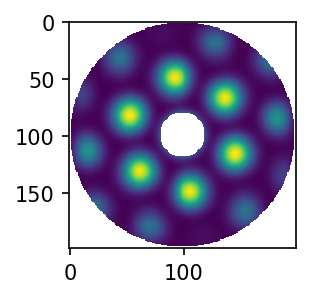

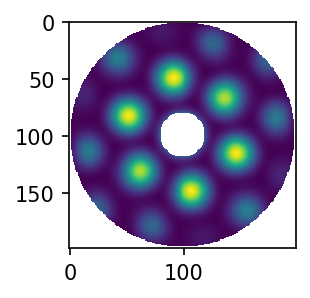

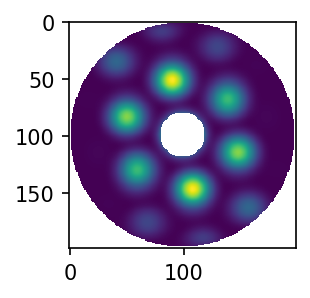

In [38]:
def annulus_mask(dims, inner_radius, outer_radius):
    center_x = int(dims[0]/2)
    center_y = int(dims[1]/2)
    
    x, y = np.ogrid[0:dims[0], 0:dims[1]]

    outer_mask = ((x - center_x) ** 2 + (y - center_y)** 2) <= (outer_radius**2)
    inner_mask = (x - center_x)**2 + (y-center_y)**2 >= (inner_radius**2)
    # larger than inner, smaller than outer is False
    return outer_mask*inner_mask

outer = int(corrs.shape[-1]/2) 
inner = int(corrs.shape[-1]/2*0.2)
mask = annulus_mask(corrs.shape[-2:], inner, outer)

for i in range(10):
    img = np.copy(corrs[0,i])
    img[~mask] = np.nan
    plt.figure()
    plt.imshow(img)


In [39]:
flat_mask = np.ravel(mask)
result = []

std_mask = []

print(np.sum(flat_mask))

for i in range(len(corrs)):
    
    corr_annulus = np.zeros((corrs.shape[1], np.sum(flat_mask)))
    for j in range(corrs.shape[1]):
        corr_annulus[j] = np.ravel(corrs[i,j])[flat_mask]
    
    annulus_std = np.std(corr_annulus, axis = -1) # std over space
    std_mask.append(annulus_std != 0)
    accepted = corr_annulus[annulus_std != 0]

    annulus_mean = np.mean(accepted, axis = -1, keepdims = True)
    standardized = (accepted - annulus_mean)/np.std(accepted, axis = -1, keepdims = True)
    #result.append(standardized)
    #print(corr_annulus.shape)
    result.append(corr_annulus)

29632


In [40]:
import matplotlib.cm as cm

low_dim = []
cluster_labels = []
for i in range(len(result)):
    transform = umap.UMAP(metric = "manhattan", n_neighbors = 30, min_dist = 0.05, init = "spectral")
    low_dim.append(transform.fit_transform(result[i]))
    print(low_dim[-1].shape)
    clustering = DBSCAN(min_samples = 30, eps = 0.9).fit(low_dim[-1])
    cluster_labels.append(clustering.labels_)
    print(cluster_labels[-1].shape)

(1500, 2)
(1500,)


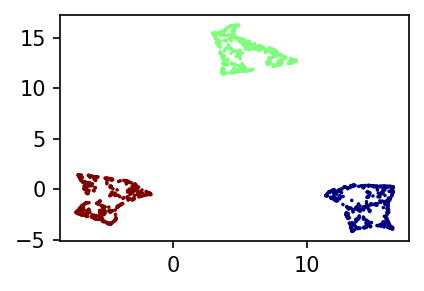

In [41]:
colors = ["r", "g", "b", "c", "m", "k", "steelblue"]
for i in range(len(low_dim)):
    plt.scatter(low_dim[i][:,0], low_dim[i][:,1], s = 0.5,c = cluster_labels[i], cmap = "jet")
    plt.show()

In [45]:
# try in env 0

for ind in np.unique(cluster_labels[0]):
    accept_mask = cluster_labels == ind
    print(accept_mask)
    
    

[[ True  True  True ... False False False]]
[[False False False ... False False False]]
[[False False False ...  True  True  True]]


In [ ]:
z = synth_maps[0]
print(ratemaps.shape)
z = np.reshape(z, (z.shape[0], -1)).T
print(z.shape)
u2 = umap.UMAP(n_components = 3).fit_transform(z)

In [ ]:
plot_3d_proj(u2, np.ones(len(u2)))